<a href="https://colab.research.google.com/github/derekbomfimprates/ConvolutionalNeuralNetworkAndTransferLearning/blob/main/CA3_B9DA109_Convolutional_neural_network_and_transfer_learning_algorithm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Convolutional neural network and transfer learning algorithm**


Please fill out and attach asthe first page of Assignment.

**Name**:
1. Derek Bomfim Prates




**TASK**

Using the image dataset from the following link
(https://drive.google.com/drive/folders/1QGOx4H_bQHCdHmmOu2yt8mbmgqe8tMPq?usp=sharing)
apply two classification models and compare their results.

One model must be a convolutional neural
network (CNN),


and the second must use a transfer learning algorithm for the same dataset.


To achieve
maximum points, it's essential to incorporate fine-tuning and tackle any class imbalance concerns.


The
images are categorized according to their respective labels: Product 1 corresponds to class 1, Product
2 to class 2, and so forth, while Background encompasses background images.



These can be utilized
for additional preprocessing,



 if necessary, thus it's crucial to figure out the appropriate method for
importing and utilizing the data.



 You must document your code and give a full explanation about
what each block of code does to receive full marks

We will describe all basic machine learning steps on this document:

1. Examine and understand data
2. Build an input pipeline
3. Build the model
4. Train the model
5. Test the model
6. Improve the model and repeat the process

**IMPORTANT NOTE:**  Some code is commented out as the dataset has already been created and modified, and does not need to be rerun.


# Package Instalation

In [ ]:
!pip install rembg # for library

# Import Section

In [ ]:
# Importing necessary libraries

import matplotlib.pyplot as plt              # For plotting data
import seaborn as sns                        # For advanced plotting functionalities
import pandas as pd                          # For data manipulation with dataframes
import numpy as np                           # For numerical operations

import os                                    # For interacting with the operating system
import glob                                  # For file operations
import PIL                                   # Python Imaging Library for image processing
from PIL import Image                        # Module for handling images
from pathlib import Path                    # For handling file paths

import cv2                                   # OpenCV library for computer vision tasks
from google.colab.patches import cv2_imshow  # For displaying images in Colab
from rembg import remove                     # Library for background removal

import tensorflow as tf                     # TensorFlow for deep learning tasks
from tensorflow import keras                # High-level neural networks API
from tensorflow.keras import layers         # Keras layers for building neural networks
from tensorflow.keras.models import Sequential  # Sequential model for linear stack of layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Data augmentation for images
from keras.preprocessing.image import load_img, array_to_img, img_to_array  # Image preprocessing utilities
from keras.utils import to_categorical      # For one-hot encoding of target labels
from keras.layers import Dense              # Dense layer for fully connected neural networks
from keras.applications.inception_v3 import preprocess_input  # Preprocessing for InceptionV3 model
from keras.applications.vgg16 import preprocess_input         # Preprocessing for VGG16 model
from keras.applications.vgg16 import decode_predictions       # Decoding predictions from VGG16 model
from keras.applications.vgg16 import VGG16                    # Pre-trained VGG16 model
from tensorflow.keras.applications import VGG16

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay # Confusion Matrix report and creation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping # To use the Early Stopping on the model analysis
from tensorflow.keras import layers, Sequential # Helo in builing the model

from tensorflow.keras.models import Model  # Model to help in learning Algorithm



# Data Loading

- **Import and explore the dataset**

This machine learning algorithm will use a dataset of about 1938 photos of meat. The dataset contains five sub-directories, one per class:

/content/drive/MyDrive/Colab Notebooks/Datasets/meat_photos/
Product_1/
Product_2/
Product_3/
Product_4/
Product_5/
Backgroud/

As the dataset contains a large number of pictures and separated by folders, it was decided to mount the drive to ensure the all pictures will be updated.

In [ ]:
# mounting to google driver
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


- **IMPORTANT:** We are defining the height and width to be the same for all images. This information will be used in the preprocessing steps. Also, we set the batch size.

First, we will define/set some parameters based on the original parameters:

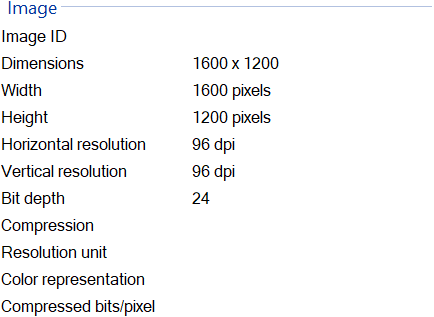

In [ ]:
img_height, img_width = 180,180
batch_size  = 32

- **IMPORTANT:** We set the folder_path where all images are. Also we use the Path() class to represents a directory path in a platform-independent way. And this way, we can  manipulate file paths easier.

In [ ]:
folder_path  =  "/content/drive/MyDrive/ColabNotebooks/Datasets/Meat_Dataset"
file_path_of_meats = Path(folder_path)

- Before performing any analysis, we decided to take a look at the dataset to ensure it was loaded correctly and to get an idea of its contents.

In [ ]:
#counting the amount of data with the extension '.JPEG'.
meat_images_count = len(list(file_path_of_meats.glob('*/*.jpg')))
print(f"Number of meat photos files with extension '.JPEG' are: {meat_images_count}")

Number of meat photos files with extension '.JPEG' are: 2449


In [ ]:
# Checking the folder names (Types of meat products)
def countImagens():
  folder_path = "/content/drive/MyDrive/ColabNotebooks/Datasets/Meat_Dataset/"
  items = os.listdir(folder_path)
  folders = [item for item in items if os.path.isdir(os.path.join(folder_path, item))]
  # Counting imagens in all folders
  for index, item in enumerate(folders):
    file_1 = folder_path + folders[index]
    # Use glob to find all .jpg files in the folder
    os.chdir(file_1)

    jpg_files = glob.glob('*.jpg')

    # Count the number of .jpg files found
    count = len(jpg_files)
    print(f"The dataset {folders[index]} has {count} items of the type .jpg")
countImagens()

The dataset Product_1 has 500 items of the type .jpg
The dataset Product_5 has 600 items of the type .jpg
The dataset Product_3 has 400 items of the type .jpg
The dataset Product_4 has 385 items of the type .jpg
The dataset .ipynb_checkpoints has 0 items of the type .jpg
The dataset Product_2 has 564 items of the type .jpg


- Let's check if there are any photos with different extensions, since the dataset is large and it's not possible to manually check photo by photo.




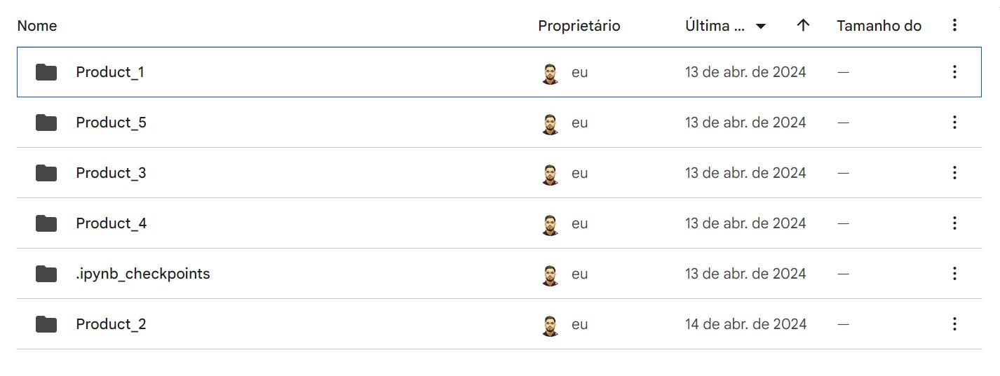


In [ ]:
# List all image files (assuming '.jpg' and '.jpeg' format)
all_images = list(file_path_of_meats.glob('**/*.*'))
non_jpeg_images = [img for img in all_images if img.suffix not in ['.jpg', '.jpeg']]


# Count the files that are not JPEG images
print(f"Total non-JPEG images found: {len(non_jpeg_images)}")

# Only one file was found, but it is a Colab file that was automatically generated

Total non-JPEG images found: 2


- Printing some images to check the data.

**IMPORTANT:** We are using glob method to check the pattern ('Product_1/*') to match all files within the 'Product_1' directory.

First, str(product_1[0]) is used to convert the file path to a string before passing it to the open function.

To open the first file [0] in the list product_1 as an image using the Python Imaging Library (PIL).

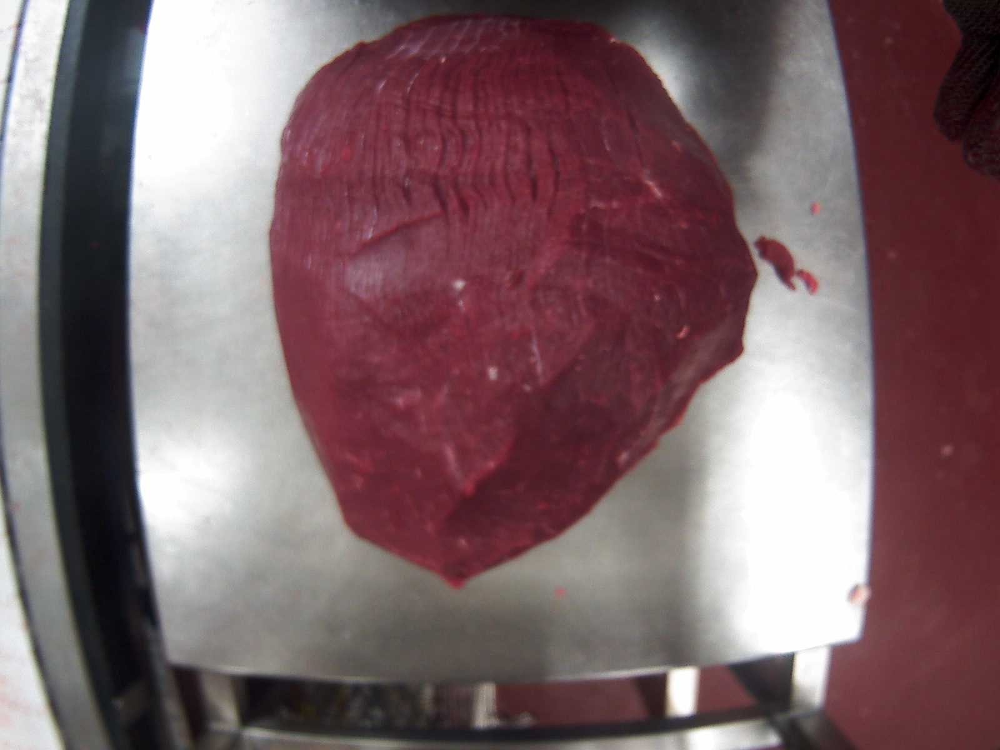

In [ ]:
product_1 = list(file_path_of_meats.glob('Product_1/*'))
PIL.Image.open(str(product_1[0]))

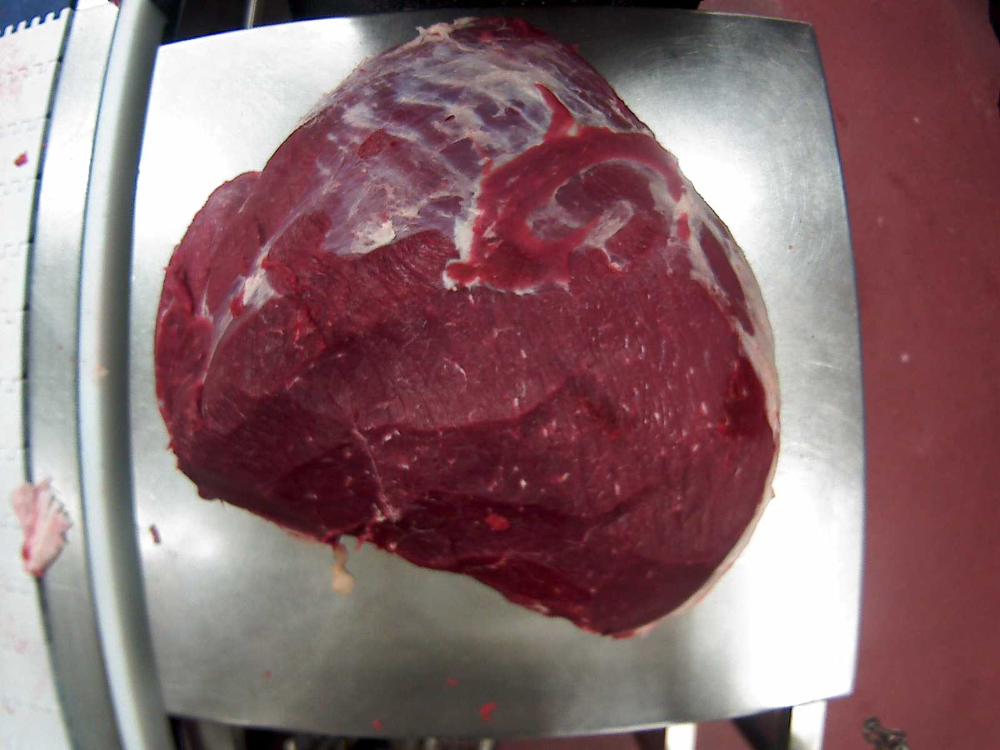

In [ ]:
product_2 = list(file_path_of_meats.glob('Product_2/*'))
PIL.Image.open(str(product_2[10]))

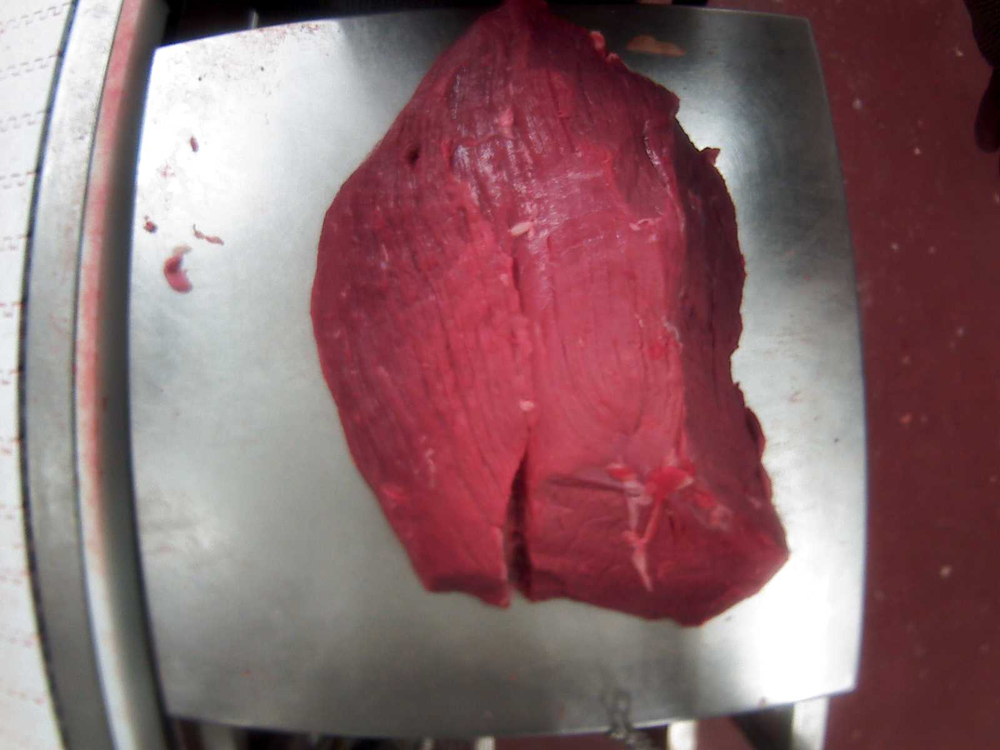

In [ ]:
product_3 = list(file_path_of_meats.glob('Product_3/*'))
PIL.Image.open(str(product_3[20]))

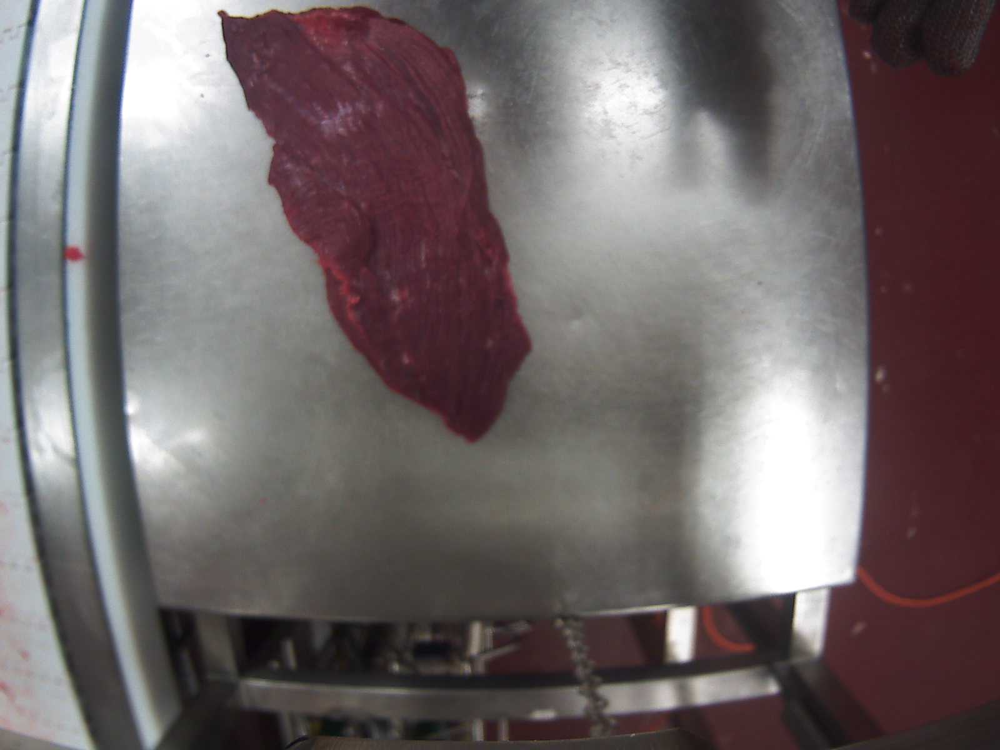

In [ ]:
product_4 = list(file_path_of_meats.glob('Product_4/*'))
PIL.Image.open(str(product_4[30]))

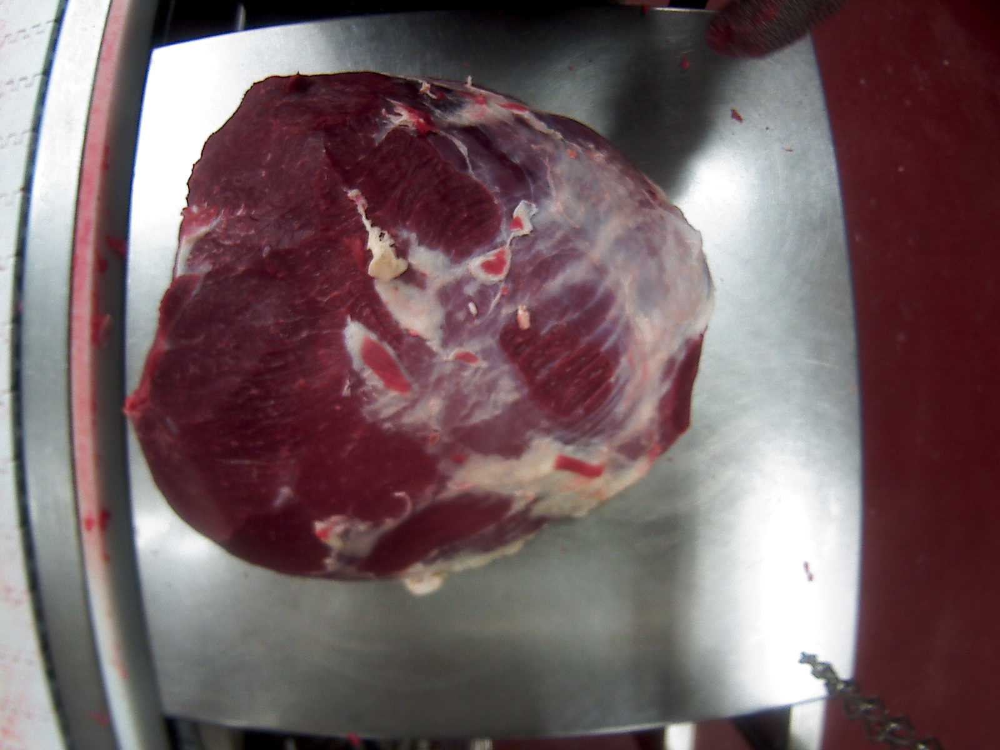

In [ ]:
product_5 = list(file_path_of_meats.glob('Product_5/*'))
PIL.Image.open(str(product_5[0]))

- **IMPORTANT:** We decided to store the background images outside the Meat_Dataset folder on the following directory:

/content/drive/MyDrive/ColabNotebooks/Datasets/Background/

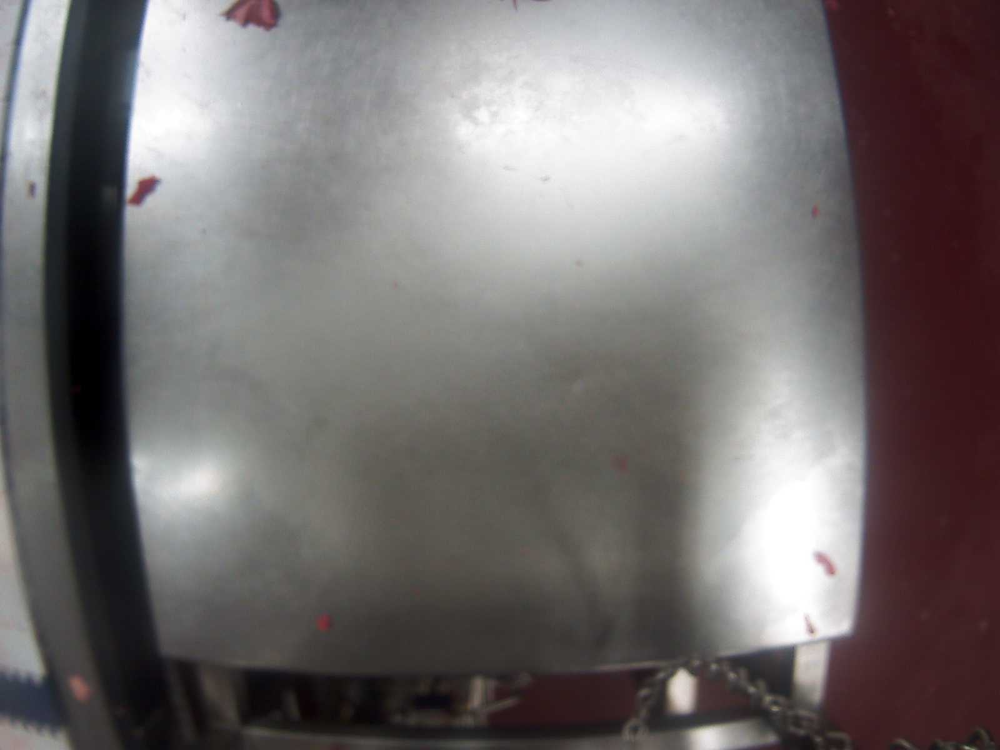

In [ ]:
folder_path_dataset  =  "/content/drive/MyDrive/ColabNotebooks/Datasets/"
file_path_background = Path(folder_path_dataset)


background_photo = list(file_path_background.glob('Background/*'))
PIL.Image.open(str(background_photo[0]))

# Balancing the classes

As the Product 2 has only 14 items we deceided to balance it using Data Augmentation.
Apply data augmentation techniques to generate new samples for the minority classes. We decided to apply the common data augmentation techniques for images such as rotation, flipping, scaling, cropping, and adding noise.

Data Augmentation

- **IMPORTANT:** Directory containing images of Product_2
(Note that we store Product_2 outside the Meat_dataset directory for simplicity,
and later we only move the folder with the balanced class back inside Meat_dataset)


In [ ]:
num_img_wanted = 400 # How many images i want to create (It is a mean of the rest of the Products)
# Directory where my imagens are now
product_folder = "/content/drive/MyDrive/ColabNotebooks/Datasets/Product_2"

# Directory where i will save the new one

# Diretório onde as imagens aumentadas serão salvas
output_folder = "/content/drive/MyDrive/ColabNotebooks/Datasets/Meat_Dataset/Product_2"

# Make sure the folder exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Calculating how many times i will interate to create the amount of imagens i want to
# we have only 14 imagens on product_folder = len(product_folder)
rep_need = num_img_wanted // len(product_folder)
print(f"Number of imagens necessary {num_img_wanted}")
print(f"Number of repetition needed {rep_need}")'''


'num_img_wanted = 400 # How many images i want to create (It is a mean of the rest of the Products)\n# Directory where my imagens are now\nproduct_folder = "/content/drive/MyDrive/ColabNotebooks/Datasets/Product_2"\n\n# Directory where i will save the new one\n\n# Diretório onde as imagens aumentadas serão salvas\noutput_folder = "/content/drive/MyDrive/ColabNotebooks/Datasets/Meat_Dataset/Product_2"\n\n# Make sure the folder exist\nif not os.path.exists(output_folder):\n    os.makedirs(output_folder)\n\n# Calculating how many times i will interate to create the amount of imagens i want to\n# we have only 14 imagens on product_folder = len(product_folder)\nrep_need = num_img_wanted // len(product_folder)\nprint(f"Number of imagens necessary {num_img_wanted}")\nprint(f"Number of repetition needed {rep_need}")'

In [ ]:
# Set ImageDataGenerator for augmentation with different parameters (X represent the value sent to the function)
def datagenImg(rotatio_r, width_shift_r, height_shift_r, shear_r):
  datagen = ImageDataGenerator(
      rotation_range=rotatio_r,  # Random rotation between -X to +X degrees.
      width_shift_range=width_shift_r,  # Maximum horizontal shift of X% of the image width.
      height_shift_range= height_shift_r,  # Maximum vertical shift of X% of the image height.
      shear_range=shear_r,  # Random shearing in the range of -X to +X degrees.
      zoom_range=0.2,  # # Random zoom in the range of 80% to 120%.
      horizontal_flip=True,  # Random horizontal flip.
      fill_mode='nearest'  # How to fill newly created pixels.
  )
  return datagen'''

"def datagenImg(rotatio_r, width_shift_r, height_shift_r, shear_r):\n  datagen = ImageDataGenerator(\n      rotation_range=rotatio_r,  # Random rotation between -X to +X degrees.\n      width_shift_range=width_shift_r,  # Maximum horizontal shift of X% of the image width.\n      height_shift_range= height_shift_r,  # Maximum vertical shift of X% of the image height.\n      shear_range=shear_r,  # Random shearing in the range of -X to +X degrees.\n      zoom_range=0.2,  # # Random zoom in the range of 80% to 120%.\n      horizontal_flip=True,  # Random horizontal flip.\n      fill_mode='nearest'  # How to fill newly created pixels.\n  )\n  return datagen"

In [ ]:
# Inicial parameters (they will be changed in the loop)
rotation_r=10
width_shift_r=0.1
height_shift_r=0.1
shear_r=0.1
zoom_r=0.1
#list of where we are keep the imagens
augmented_images_paths = []

# Repeat origial image
for _ in range(rep_need):
  datagen=datagenImg(rotation_r, width_shift_r, height_shift_r, shear_r)
  # Loop over the pictures in the directory Product_2
  for filename in os.listdir(product_folder):
      if filename.endswith('.jpg') or filename.endswith('.png'):
          # Loading the imagen
          image = cv2.imread(os.path.join(product_folder, filename))
          # Expand the dimensions of the image to match the format expected by the ImageDataGenerator.
          image = np.expand_dims(image, axis=0)
          # Create a  generation of augmented image
          augmented_generator = datagen.flow(image, batch_size=1, save_to_dir=output_folder, save_prefix='aug', save_format='jpg')
          # Create and salve augmented imagens
          for i in range(5):  # Generate 5 augmented images for each original image.
              augmented_image = augmented_generator.next()[0].astype(np.uint8)
              augmented_image_path = os.path.join(output_folder, f"augmented_{filename.split('.')[0]}_{i+1}.jpg")
              cv2.imwrite(augmented_image_path, augmented_image)
              augmented_images_paths.append(augmented_image_path)

  # Print Path of augmented imagens
  print("Path of augmented imagens:")
  for path in augmented_images_paths:
      print(path)
  #Here we are increading the parameters every loop
  rotation_r+=5
  width_shift_r+=0.02
  height_shift_r+=0.02
  shear_r+=0.2
  zoom_r+=0.2'''


'rotation_r=10\nwidth_shift_r=0.1\nheight_shift_r=0.1\nshear_r=0.1\nzoom_r=0.1\n#list of where we are keep the imagens\naugmented_images_paths = []\n\n# Repeat origial image\nfor _ in range(rep_need):\n  datagen=datagenImg(rotation_r, width_shift_r, height_shift_r, shear_r)\n  # Loop over the pictures in the directory Product_2\n  for filename in os.listdir(product_folder):\n      if filename.endswith(\'.jpg\') or filename.endswith(\'.png\'):\n          # Loading the imagen\n          image = cv2.imread(os.path.join(product_folder, filename))\n          # Expand the dimensions of the image to match the format expected by the ImageDataGenerator.\n          image = np.expand_dims(image, axis=0)\n          # Create a  generation of augmented image\n          augmented_generator = datagen.flow(image, batch_size=1, save_to_dir=output_folder, save_prefix=\'aug\', save_format=\'jpg\')\n          # Create and salve augmented imagens\n          for i in range(5):  # Generate 5 augmented images 

In [ ]:
# We are counting the amount of imagens and each folder after performed the augmente
countImagens()

The dataset Product_1 has 500 items of the type .jpg
The dataset Product_5 has 600 items of the type .jpg
The dataset Product_3 has 400 items of the type .jpg
The dataset Product_4 has 385 items of the type .jpg
The dataset .ipynb_checkpoints has 0 items of the type .jpg
The dataset Product_2 has 564 items of the type .jpg


# Background treatment

- **IMPORTANT:** We decided to explore two methods for background removal:


1. The first approach involves using a library that automates the process entirely.

2. The second approach entails experimenting with various parameters to remove the background manually. These parameters include using previous background images, converting the image to grayscale, reducing noise, and most importantly, applying thresholding. We found that thresholding produced the best results when we experimented with different threshold values (ranging from 40 to 100). Among them, 90 yielded the best outcome when combined with the other parameters.

In [ ]:
# Define the directory where the product images are stored
dataset_directory = '/content/drive/MyDrive/ColabNotebooks/Datasets/Meat_Dataset'

# Define the directory where the background images are stored
background_directory = '/content/drive/MyDrive/ColabNotebooks/Datasets/Background'

# List the names of the products
product_names = os.listdir(dataset_directory)

# Load background images
background_images = [os.path.join(background_directory, filename) for filename in os.listdir(background_directory)]

# Iterate over each product
for product_name in product_names:
    product_directory = os.path.join(dataset_directory, product_name)

    # Check if it's a directory
    if os.path.isdir(product_directory):
        print(f"Processing images of the product: {product_name}")

        # Create directories for processed images, if they don't exist
        processed_directory = os.path.join(product_directory, 'Processed')
        os.makedirs(processed_directory, exist_ok=True)

        # List the paths of the product object images
        object_image_paths = [os.path.join(product_directory, filename) for filename in os.listdir(product_directory) if filename.endswith('.jpg')]

        # Iterate over each object image
        for object_image_path in object_image_paths:
            # Load the object image
            with open(object_image_path, "rb") as f:
                img = f.read()

            # Remove the background from the object image
            result_img = remove(img)

            # Save the processed image in the corresponding folder
            output_path = os.path.join(processed_directory, os.path.basename(object_image_path))
            with open(output_path, "wb") as f:
                f.write(result_img)

            print(f"Processed image saved to: {output_path}")

print("Image processing completed.") '''


'\n# Iterate over each product\nfor product_name in product_names:\n    product_directory = os.path.join(dataset_directory, product_name)\n\n    # Check if it\'s a directory\n    if os.path.isdir(product_directory):\n        print(f"Processing images of the product: {product_name}")\n\n        # Create directories for processed images, if they don\'t exist\n        processed_directory = os.path.join(product_directory, \'Processed\')\n        os.makedirs(processed_directory, exist_ok=True)\n\n        # List the paths of the product object images\n        object_image_paths = [os.path.join(product_directory, filename) for filename in os.listdir(product_directory) if filename.endswith(\'.jpg\')]\n\n        # Iterate over each object image\n        for object_image_path in object_image_paths:\n            # Load the object image\n            with open(object_image_path, "rb") as f:\n                img = f.read()\n\n            # Remove the background from the object image\n            res

In [ ]:
# Define the paths
product_categories = ['Product_1', 'Product_2', 'Product_3', 'Product_4', 'Product_5']
dataset_dir = '/content/drive/MyDrive/ColabNotebooks/Datasets/Meat_Dataset'
background_img_path = '/content/drive/MyDrive/ColabNotebooks/Datasets/Background/background1501738359.895.jpg'
output_dir = '/content/drive/MyDrive/ColabNotebooks/Datasets/PreprocessingData'

In [ ]:
# Ensure the output directory exists
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Process each product category
for category in product_categories:
    product_dir = os.path.join(dataset_dir, category)
    output_category_dir = os.path.join(output_dir, category)

    # Ensure the output category directory exists
    if not os.path.exists(output_category_dir):
        os.makedirs(output_category_dir)

    # Loop through each image in the category directory
    for filename in os.listdir(product_dir):
        if filename.endswith('.jpg'):
            # Load the product image
            product_img_path = os.path.join(product_dir, filename)
            product_img = cv2.imread(product_img_path)

            # Load the background image
            background_img = cv2.imread(background_img_path)

            # Apply background removal

            # Convert the image to grayscale
            product_gray = cv2.cvtColor(product_img, cv2.COLOR_BGR2GRAY)
            background_gray = cv2.cvtColor(background_img, cv2.COLOR_BGR2GRAY)

            # Apply a median filter to smooth the images
            product_median = cv2.medianBlur(product_gray, 5)
            background_median = cv2.medianBlur(background_gray, 5)

            # Thresholding of the smoothed images
            product_threshold = cv2.threshold(product_median, 90, 255, cv2.THRESH_BINARY)[1]
            background_threshold = cv2.threshold(background_median, 40, 255, cv2.THRESH_BINARY)[1]

            # Invert the product mask to obtain the background mask
            background_mask = cv2.bitwise_not(product_threshold)

            # Define the central region of the image to keep
            height, width = product_img.shape[:2]
            center_mask = np.zeros_like(background_mask)
            center_mask[:, 200:1300] = 255

            # Apply the background mask only to the central region of the image
            background_mask = cv2.bitwise_and(background_mask, center_mask)

            # Apply an opening operation to smooth the edges of the background mask
            kernel = np.ones((5,5),np.uint8)
            background_mask = cv2.morphologyEx(background_mask, cv2.MORPH_OPEN, kernel)

            # Apply the background mask to remove the background from the original product image
            foreground_img = cv2.bitwise_and(product_img, product_img, mask=background_mask)

            # Display the images
            plt.figure(figsize=(12, 8))


            plt.subplot(231)
            plt.imshow(product_img[:, :, ::-1])
            plt.title('Imagem Original of Product')

            plt.subplot(232)
            plt.imshow(product_gray, cmap='gray')
            plt.title('Grayscale of Product')

            plt.subplot(233)
            plt.imshow(product_threshold, cmap='gray')
            plt.title('Thresholding of Product')

            plt.subplot(234)
            plt.imshow(background_img[:, :, ::-1])
            plt.title('Background image')

            plt.subplot(235)
            plt.imshow(background_gray, cmap='gray')
            plt.title('Grayscale of background')

            plt.subplot(236)
            plt.imshow(foreground_img[:, :, ::-1])
            plt.title('Background imagen')

            plt.tight_layout()
            plt.show()

            # Save the processed image to the output directory
            output_path = os.path.join(output_category_dir, filename)
            cv2.imwrite(output_path, foreground_img) '''

"# Ensure the output directory exists\nif not os.path.exists(output_dir):\n    os.makedirs(output_dir)\n\n# Process each product category\nfor category in product_categories:\n    product_dir = os.path.join(dataset_dir, category)\n    output_category_dir = os.path.join(output_dir, category)\n\n    # Ensure the output category directory exists\n    if not os.path.exists(output_category_dir):\n        os.makedirs(output_category_dir)\n\n    # Loop through each image in the category directory\n    for filename in os.listdir(product_dir):\n        if filename.endswith('.jpg'):\n            # Load the product image\n            product_img_path = os.path.join(product_dir, filename)\n            product_img = cv2.imread(product_img_path)\n\n            # Load the background image\n            background_img = cv2.imread(background_img_path)\n\n            # Apply background removal\n\n            # Convert the image to grayscale\n            product_gray = cv2.cvtColor(product_img, cv2.COLOR

# Training and Validation Sets

- **IMPORTANT:**  Creating the Training and Validation Datasets for Each Background Removal Approach



- **IMPORTANT:** First approach

- Using Keras to create a train and validation sets from imagens in a directory.

In [ ]:
# Create the training dataset
output_dir= '/content/drive/MyDrive/ColabNotebooks/Datasets/NoBackground-rembg'
#output_dir= '/content/drive/MyDrive/ColabNotebooks/Datasets/PreprocessingData'
train_ds = tf.keras.utils.image_dataset_from_directory(
    output_dir,                                           # Dataset directory
    validation_split=0.2,                                 # Splitting the data into 80% training and 20% validation
    subset="training",                                    # This will be the training set
    seed=123,                                             # Seed for doing it again and check results
    image_size=(img_height, img_width),                   # Set height and width imagens definity in the first section
    batch_size=batch_size                                 # Batch size for training - definied in the first section
)

# Create the validation dataset
val_ds = tf.keras.utils.image_dataset_from_directory(
    output_dir,
    validation_split=0.2,
    subset="validation",                                  # This will be the validation data
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)


Found 2449 files belonging to 5 classes.
Using 1960 files for training.
Found 2449 files belonging to 5 classes.
Using 489 files for validation.


- **IMPORTANT:** First approach

- Using Keras to create a train and validation sets from imagens in a directory.

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  file_path_of_meats,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)'''

'train_ds = tf.keras.utils.image_dataset_from_directory(\n  file_path_of_meats,\n  validation_split=0.2,\n  subset="training",\n  seed=123,\n  image_size=(img_height, img_width),\n  batch_size=batch_size)'

In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  file_path_of_meats,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)'''

'val_ds = tf.keras.utils.image_dataset_from_directory(\n  file_path_of_meats,\n  validation_split=0.2,\n  subset="validation",\n  seed=123,\n  image_size=(img_height, img_width),\n  batch_size=batch_size)'

- **IMPORTANT:**  Good practice: print and store the class names.

In [ ]:
class_names = train_ds.class_names
print(class_names)

['Product_1', 'Product_2', 'Product_3', 'Product_4', 'Product_5']


# Configure the dataset for performance

In [ ]:

# Buffered prefetching to yield data from disk without having I/O become blocking.
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Standardize the data
The RGB channel values are in the [0, 255] range, which is not ideal for a neural network. Therefore, we decided to standardize the values to be in the [0, 1] range using the tf.keras.layers.Rescaling layer.

In [ ]:
normalization_layer = layers.Rescaling(1./255)

In [ ]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 0.7429196


# Model

A bad strategy for our problem was the following models, as they do not contain dropout and do not prevent overfitting.

- **Model 1 -** Without background removal:

In [ ]:
num_classes = len(class_names)
model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 90, 90, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 45, 45, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

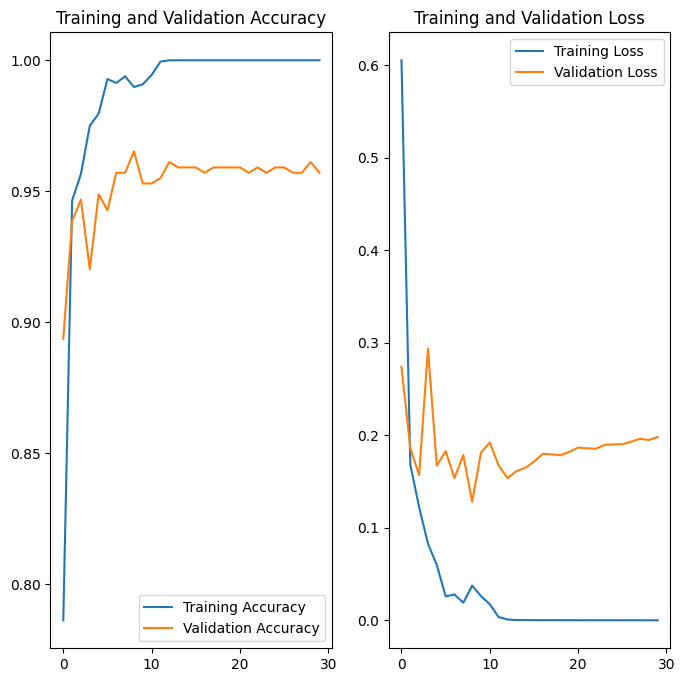

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

epochs=30
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

A bad strategy for our problem was the following model, as it does not contain dropout and does not prevent overfitting.

- **Model 2 -** With background removal (rembg):

In [ ]:
num_classes = len(class_names)
model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 90, 90, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 45, 45, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 45, 45, 64)       

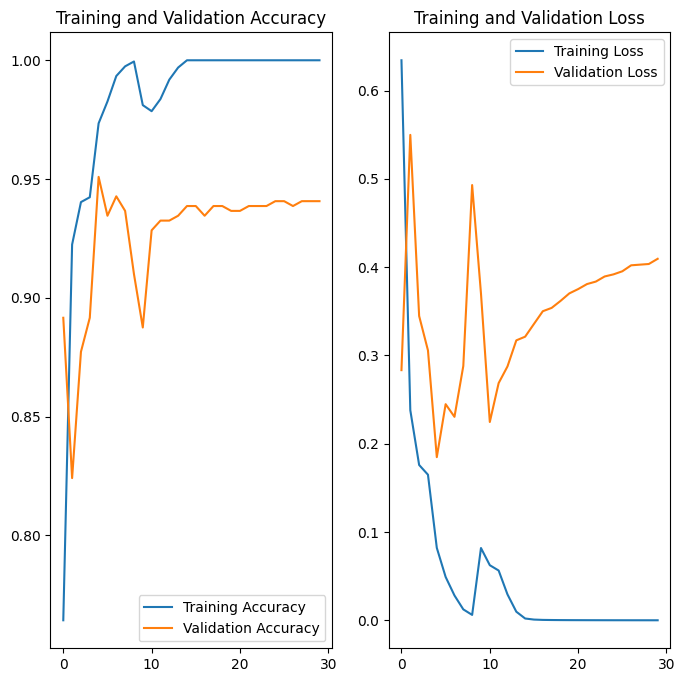

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

epochs=30
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

A bad strategy for our problem was the following model, as it does not contain dropout and does not prevent overfitting.

- **Model 3 -** With background removal (Thresholding and masking to support background removal):

In [ ]:
num_classes = len(class_names)
model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_5 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 90, 90, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 45, 45, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 45, 45, 64)       

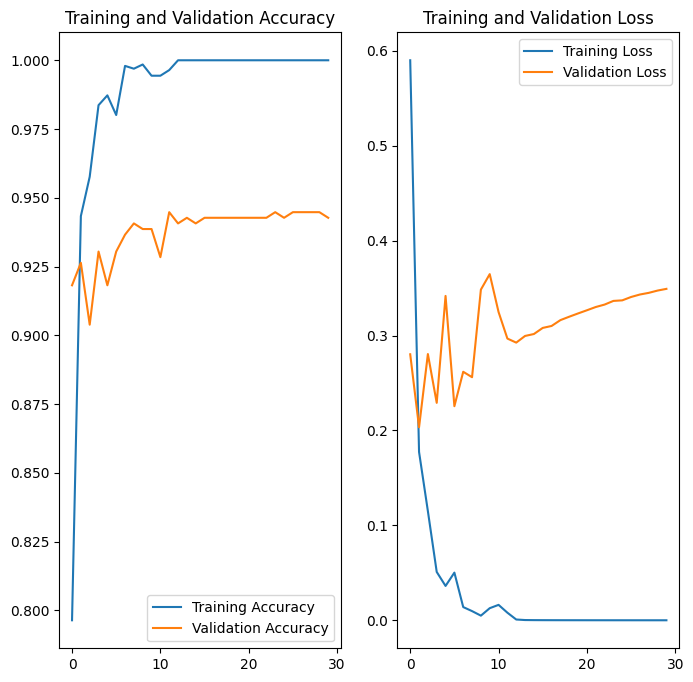

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

epochs=30
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

A good strategy for our problem was the following models, as they do contain **dropout** to prevent **overfitting**.


- **Model 4 -** Using dropout without background removal.

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_10 (Rescaling)    (None, 180, 180, 3)       0         
                                                                 
 conv2d_15 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 90, 90, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_16 (Conv2D)          (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 45, 45, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_17 (Conv2D)          (None, 45, 45, 128)      

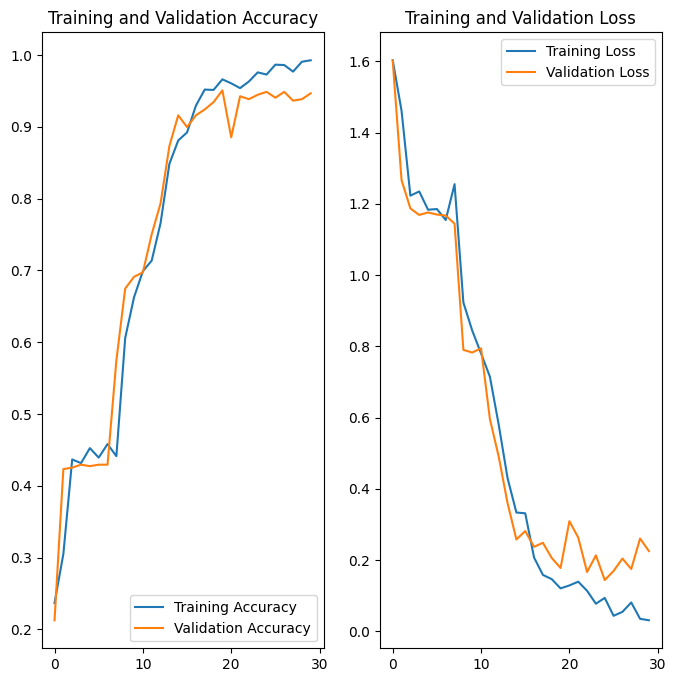

In [ ]:
num_classes = len(class_names)

model = Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(1024, 3, padding='same', activation='relu'),  # Adding another convolutional layer
    layers.MaxPooling2D(),

    layers.Conv2D(1024, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Flatten(),
    layers.Dense(1024, activation='relu'),  # Increasing dense layer size
    layers.Dropout(0.5),
    layers.Dense(512, activation='relu'),  # Increasing dense layer size
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

epochs=30
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


- **Model 5 -** Using dropout with background removal (rembg).

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_12 (Rescaling)    (None, 180, 180, 3)       0         
                                                                 
 conv2d_22 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 90, 90, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_23 (Conv2D)          (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_23 (MaxPooli  (None, 45, 45, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_24 (Conv2D)          (None, 45, 45, 128)      

/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5727: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


62/62 [==============================] - 8s 80ms/step - loss: 1.3236 - accuracy: 0.3597 - val_loss: 1.1508 - val_accuracy: 0.4233
Epoch 2/30
62/62 [==============================] - 2s 36ms/step - loss: 0.9049 - accuracy: 0.6378 - val_loss: 0.7074 - val_accuracy: 0.6912
Epoch 3/30
62/62 [==============================] - 2s 36ms/step - loss: 0.5487 - accuracy: 0.8138 - val_loss: 0.3988 - val_accuracy: 0.8425
Epoch 4/30
62/62 [==============================] - 2s 36ms/step - loss: 0.3088 - accuracy: 0.8903 - val_loss: 0.3315 - val_accuracy: 0.8712
Epoch 5/30
62/62 [==============================] - 2s 36ms/step - loss: 0.2982 - accuracy: 0.8903 - val_loss: 0.2544 - val_accuracy: 0.8998
Epoch 6/30
62/62 [==============================] - 2s 36ms/step - loss: 0.2487 - accuracy: 0.9056 - val_loss: 0.2777 - val_accuracy: 0.9080
Epoch 7/30
62/62 [==============================] - 2s 36ms/step - loss: 0.2804 - accuracy: 0.8969 - val_loss: 0.2049 - val_accuracy: 0.9223
Epoch 8/30
62/62 [======

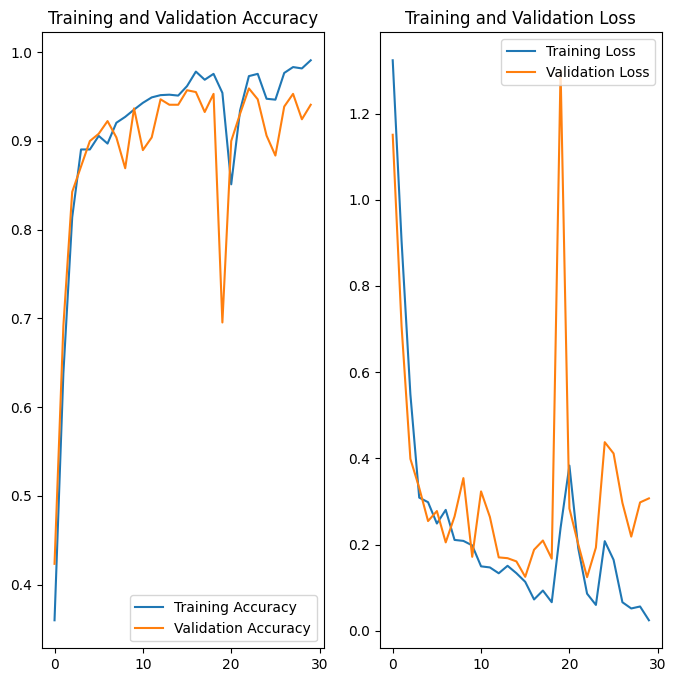

In [ ]:
num_classes = len(class_names)

model = Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(1024, 3, padding='same', activation='relu'),  # Adding another convolutional layer
    layers.MaxPooling2D(),

    layers.Conv2D(1024, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Flatten(),
    layers.Dense(1024, activation='relu'),  # Increasing dense layer size
    layers.Dropout(0.5),
    layers.Dense(512, activation='relu'),  # Increasing dense layer size
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

epochs=30
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


- **Model 6 -** With background removal (Thresholding and masking to support background removal):

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 90, 90, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 45, 45, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 128)       7

/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5727: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


62/62 [==============================] - 30s 347ms/step - loss: 1.4023 - accuracy: 0.3464 - val_loss: 1.3604 - val_accuracy: 0.4499
Epoch 2/30
62/62 [==============================] - 2s 35ms/step - loss: 0.9017 - accuracy: 0.6418 - val_loss: 0.5681 - val_accuracy: 0.8057
Epoch 3/30
62/62 [==============================] - 2s 35ms/step - loss: 0.4217 - accuracy: 0.8684 - val_loss: 0.2802 - val_accuracy: 0.8855
Epoch 4/30
62/62 [==============================] - 2s 35ms/step - loss: 0.4865 - accuracy: 0.8597 - val_loss: 0.2364 - val_accuracy: 0.9223
Epoch 5/30
62/62 [==============================] - 2s 35ms/step - loss: 0.2777 - accuracy: 0.9117 - val_loss: 0.1851 - val_accuracy: 0.9346
Epoch 6/30
62/62 [==============================] - 2s 35ms/step - loss: 0.2263 - accuracy: 0.9265 - val_loss: 0.2213 - val_accuracy: 0.9325
Epoch 7/30
62/62 [==============================] - 2s 35ms/step - loss: 0.2002 - accuracy: 0.9378 - val_loss: 0.2447 - val_accuracy: 0.9182
Epoch 8/30
62/62 [====

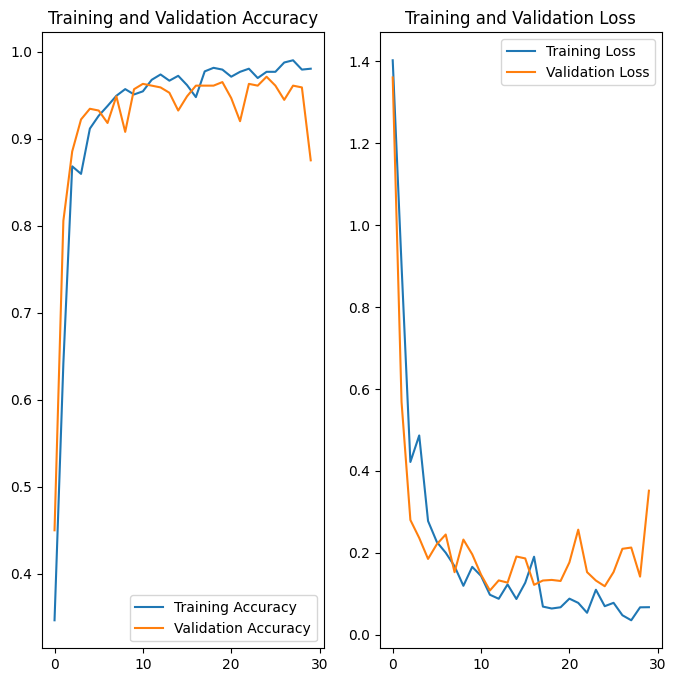

In [ ]:
num_classes = len(class_names)

model = Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(1024, 3, padding='same', activation='relu'),  # Adding another convolutional layer
    layers.MaxPooling2D(),

    layers.Conv2D(1024, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Flatten(),
    layers.Dense(1024, activation='relu'),  # Increasing dense layer size
    layers.Dropout(0.5),
    layers.Dense(512, activation='relu'),  # Increasing dense layer size
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

epochs=30
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


Based on the provided information, it seems that the second model achieves better performance:

- First Model:
Accuracy: ~99.08% (on training)
Validation Accuracy: ~94.07%
Loss: ~0.0242 (on training)
Validation Loss: ~0.3071
Total parameters: 17,303,365

- Second Model:
Accuracy: ~99.64% (on training)
Validation Accuracy: ~94.89%
Loss: ~0.0134 (on training)
Validation Loss: ~0.3210
Total parameters: 17,303,365

- Both models have the same number of parameters and architecture, but the second model achieves slightly higher accuracy and validation accuracy, with lower loss values on both training and validation sets. Therefore, the second model appears to be the better choice.

- **Model 7 -**  Let's explore the best overall model - with background removal (utilizing thresholding and masking). To achieve this, we will use a hyperparameter approach to further enhance its performance

Epoch 1/50
62/62 [==============================] - 27s 304ms/step - loss: 1.4289 - accuracy: 0.3194 - val_loss: 1.2186 - val_accuracy: 0.4254
Epoch 2/50
62/62 [==============================] - 2s 36ms/step - loss: 1.1558 - accuracy: 0.4847 - val_loss: 0.7550 - val_accuracy: 0.7301
Epoch 3/50
62/62 [==============================] - 2s 36ms/step - loss: 0.7790 - accuracy: 0.6832 - val_loss: 0.6594 - val_accuracy: 0.7137
Epoch 4/50
62/62 [==============================] - 2s 36ms/step - loss: 0.6081 - accuracy: 0.7750 - val_loss: 0.6656 - val_accuracy: 0.7669
Epoch 5/50
62/62 [==============================] - 2s 36ms/step - loss: 0.5769 - accuracy: 0.7954 - val_loss: 0.4115 - val_accuracy: 0.8487
Epoch 6/50
62/62 [==============================] - 2s 36ms/step - loss: 0.5284 - accuracy: 0.8276 - val_loss: 0.4915 - val_accuracy: 0.8241
Epoch 7/50
62/62 [==============================] - 2s 36ms/step - loss: 0.3662 - accuracy: 0.8776 - val_loss: 0.3718 - val_accuracy: 0.8732
Epoch 8/50


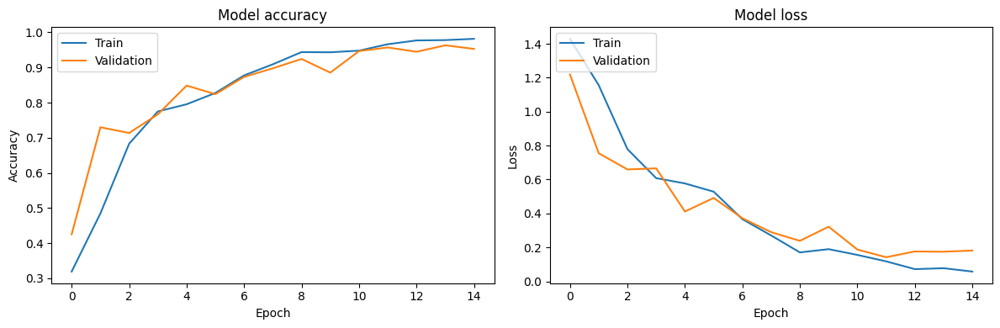

Validation Accuracy: 0.952965259552002
Learning Rate: 0.001
Dropout Rate: 0.2
Epoch 1/50
62/62 [==============================] - 5s 40ms/step - loss: 1.4808 - accuracy: 0.3173 - val_loss: 1.2594 - val_accuracy: 0.4254
Epoch 2/50
62/62 [==============================] - 2s 36ms/step - loss: 1.2266 - accuracy: 0.4444 - val_loss: 1.4038 - val_accuracy: 0.3538
Epoch 3/50
62/62 [==============================] - 2s 36ms/step - loss: 1.2317 - accuracy: 0.4332 - val_loss: 1.1865 - val_accuracy: 0.4254
Epoch 4/50
62/62 [==============================] - 2s 37ms/step - loss: 1.0304 - accuracy: 0.5505 - val_loss: 0.7955 - val_accuracy: 0.6503
Epoch 5/50
62/62 [==============================] - 2s 36ms/step - loss: 0.7366 - accuracy: 0.6954 - val_loss: 0.6948 - val_accuracy: 0.7055
Epoch 6/50
62/62 [==============================] - 2s 37ms/step - loss: 0.6214 - accuracy: 0.7628 - val_loss: 0.5446 - val_accuracy: 0.8016
Epoch 7/50
62/62 [==============================] - 2s 37ms/step - loss: 0.5

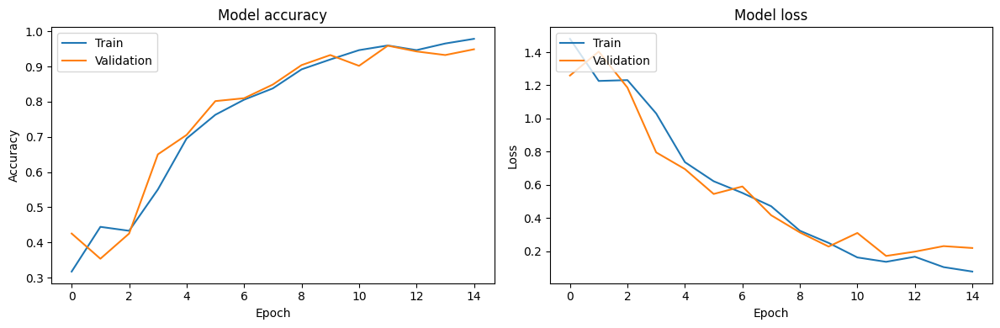

Validation Accuracy: 0.9488752484321594
Learning Rate: 0.001
Dropout Rate: 0.3
Epoch 1/50
62/62 [==============================] - 5s 40ms/step - loss: 1.3798 - accuracy: 0.3464 - val_loss: 1.2077 - val_accuracy: 0.4254
Epoch 2/50
62/62 [==============================] - 2s 37ms/step - loss: 1.4556 - accuracy: 0.3316 - val_loss: 1.5921 - val_accuracy: 0.2331
Epoch 3/50
62/62 [==============================] - 2s 37ms/step - loss: 1.5022 - accuracy: 0.3505 - val_loss: 1.2257 - val_accuracy: 0.5112
Epoch 4/50
62/62 [==============================] - 2s 37ms/step - loss: 1.0058 - accuracy: 0.5592 - val_loss: 0.7658 - val_accuracy: 0.7260
Epoch 5/50
62/62 [==============================] - 2s 37ms/step - loss: 0.7410 - accuracy: 0.6990 - val_loss: 0.6094 - val_accuracy: 0.7791
Epoch 6/50
62/62 [==============================] - 2s 37ms/step - loss: 0.6555 - accuracy: 0.7444 - val_loss: 0.5447 - val_accuracy: 0.8037
Epoch 7/50
62/62 [==============================] - 2s 37ms/step - loss: 0.

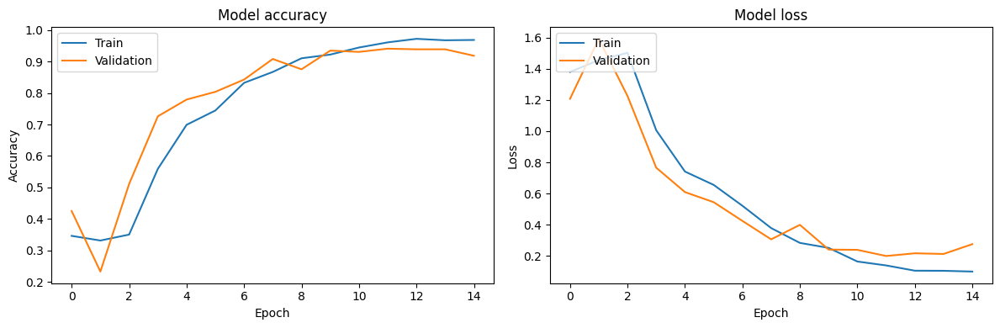

Validation Accuracy: 0.9182004332542419
Learning Rate: 0.001
Dropout Rate: 0.5
Epoch 1/50
62/62 [==============================] - 5s 40ms/step - loss: 1.6026 - accuracy: 0.2367 - val_loss: 1.6058 - val_accuracy: 0.2331
Epoch 2/50
62/62 [==============================] - 2s 37ms/step - loss: 1.4400 - accuracy: 0.3224 - val_loss: 1.5275 - val_accuracy: 0.2863
Epoch 3/50
62/62 [==============================] - 2s 37ms/step - loss: 1.2671 - accuracy: 0.4184 - val_loss: 1.1749 - val_accuracy: 0.4254
Epoch 4/50
62/62 [==============================] - 2s 37ms/step - loss: 1.2330 - accuracy: 0.4449 - val_loss: 0.8839 - val_accuracy: 0.6299
Epoch 5/50
62/62 [==============================] - 2s 37ms/step - loss: 0.8080 - accuracy: 0.6730 - val_loss: 0.6906 - val_accuracy: 0.7096
Epoch 6/50
62/62 [==============================] - 2s 37ms/step - loss: 0.6351 - accuracy: 0.7607 - val_loss: 0.5800 - val_accuracy: 0.7710
Epoch 7/50
62/62 [==============================] - 2s 37ms/step - loss: 0.

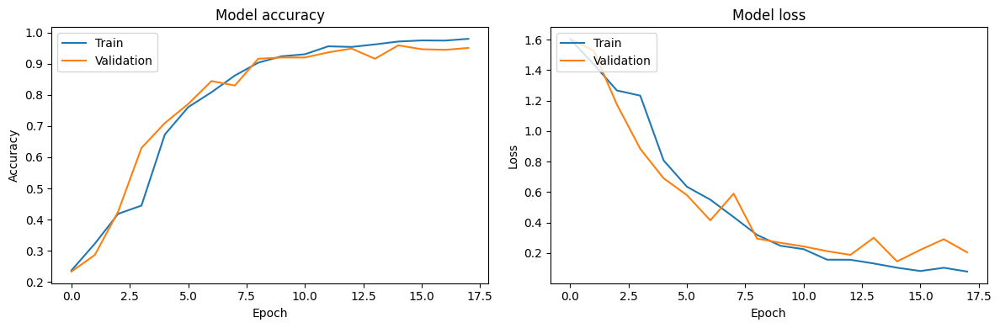

Validation Accuracy: 0.9509202241897583
Learning Rate: 0.001
Dropout Rate: 0.7
Epoch 1/50
62/62 [==============================] - 5s 38ms/step - loss: 217.1847 - accuracy: 0.2270 - val_loss: 1.6065 - val_accuracy: 0.2331
Epoch 2/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5967 - accuracy: 0.2429 - val_loss: 1.6022 - val_accuracy: 0.2331
Epoch 3/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5970 - accuracy: 0.2362 - val_loss: 1.6026 - val_accuracy: 0.2331
Epoch 4/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5942 - accuracy: 0.2388 - val_loss: 1.6064 - val_accuracy: 0.2331
Epoch 5/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5950 - accuracy: 0.2429 - val_loss: 1.6042 - val_accuracy: 0.2127


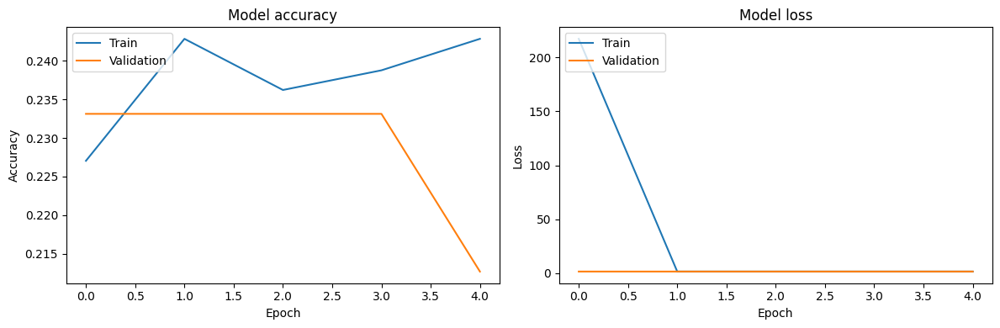

Validation Accuracy: 0.2126789391040802
Learning Rate: 0.01
Dropout Rate: 0.2
Epoch 1/50
62/62 [==============================] - 5s 39ms/step - loss: 264.7756 - accuracy: 0.2429 - val_loss: 1.6070 - val_accuracy: 0.2209
Epoch 2/50
62/62 [==============================] - 2s 35ms/step - loss: 1.6489 - accuracy: 0.2469 - val_loss: 1.6031 - val_accuracy: 0.2127
Epoch 3/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5925 - accuracy: 0.2505 - val_loss: 1.6032 - val_accuracy: 0.2331
Epoch 4/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5953 - accuracy: 0.2469 - val_loss: 1.6024 - val_accuracy: 0.2331
Epoch 5/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5926 - accuracy: 0.2531 - val_loss: 1.6039 - val_accuracy: 0.2127
Epoch 6/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5932 - accuracy: 0.2444 - val_loss: 1.6017 - val_accuracy: 0.2331
Epoch 7/50
62/62 [==============================] - 2s 35ms/step - loss: 1

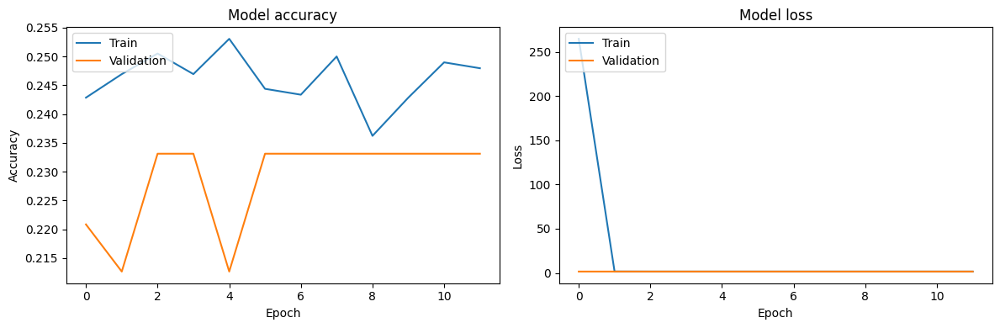

Validation Accuracy: 0.23312883079051971
Learning Rate: 0.01
Dropout Rate: 0.3
Epoch 1/50
62/62 [==============================] - 5s 38ms/step - loss: 1323.3163 - accuracy: 0.2403 - val_loss: 1.6090 - val_accuracy: 0.2331
Epoch 2/50
62/62 [==============================] - 2s 35ms/step - loss: 1.6081 - accuracy: 0.2505 - val_loss: 1.6036 - val_accuracy: 0.2331
Epoch 3/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5974 - accuracy: 0.2418 - val_loss: 1.6036 - val_accuracy: 0.2331
Epoch 4/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5942 - accuracy: 0.2541 - val_loss: 1.6037 - val_accuracy: 0.2331
Epoch 5/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5946 - accuracy: 0.2459 - val_loss: 1.6011 - val_accuracy: 0.2331
Epoch 6/50
62/62 [==============================] - 2s 35ms/step - loss: 1.5954 - accuracy: 0.2439 - val_loss: 1.6033 - val_accuracy: 0.2331
Epoch 7/50
62/62 [==============================] - 2s 36ms/step - loss:

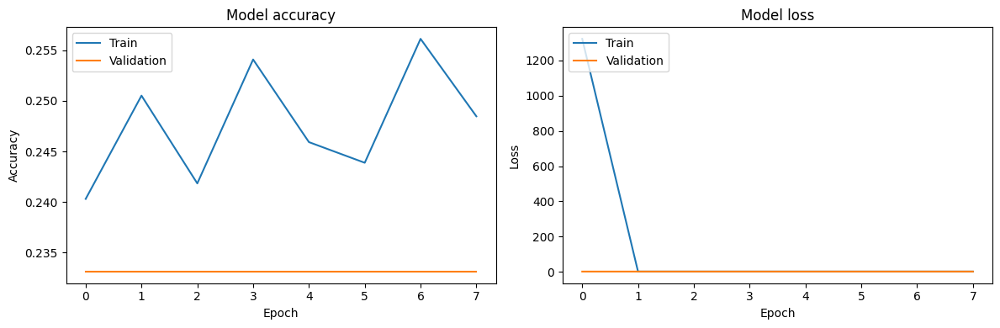

Validation Accuracy: 0.23312883079051971
Learning Rate: 0.01
Dropout Rate: 0.5
Epoch 1/50
62/62 [==============================] - 6s 39ms/step - loss: 58.7372 - accuracy: 0.2388 - val_loss: 1.6061 - val_accuracy: 0.2331
Epoch 2/50
62/62 [==============================] - 2s 36ms/step - loss: 1.6051 - accuracy: 0.2372 - val_loss: 1.6057 - val_accuracy: 0.2127
Epoch 3/50
62/62 [==============================] - 2s 36ms/step - loss: 1.5977 - accuracy: 0.2362 - val_loss: 1.6024 - val_accuracy: 0.2331
Epoch 4/50
62/62 [==============================] - 2s 36ms/step - loss: 1.5966 - accuracy: 0.2413 - val_loss: 1.6032 - val_accuracy: 0.2331
Epoch 5/50
62/62 [==============================] - 2s 36ms/step - loss: 1.5939 - accuracy: 0.2505 - val_loss: 1.6067 - val_accuracy: 0.2331
Epoch 6/50
62/62 [==============================] - 2s 36ms/step - loss: 1.5957 - accuracy: 0.2352 - val_loss: 1.6036 - val_accuracy: 0.2331


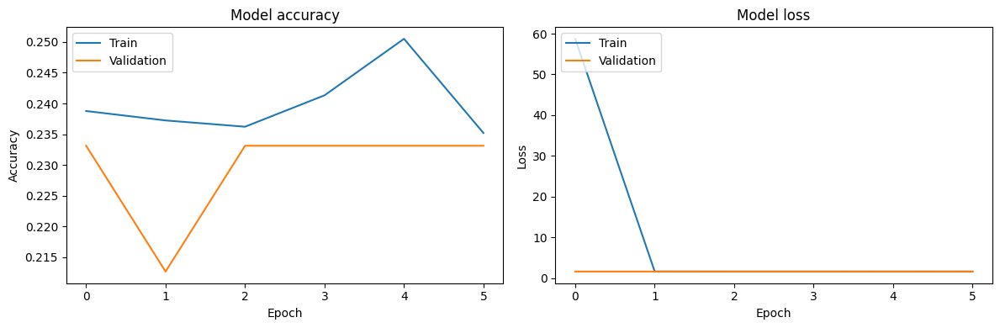

Validation Accuracy: 0.23312883079051971
Learning Rate: 0.01
Dropout Rate: 0.7
Epoch 1/50
62/62 [==============================] - 5s 39ms/step - loss: 108579782656.0000 - accuracy: 0.2000 - val_loss: 1.7060 - val_accuracy: 0.1575
Epoch 2/50
62/62 [==============================] - 2s 36ms/step - loss: 260.5516 - accuracy: 0.2219 - val_loss: 1.6013 - val_accuracy: 0.2127
Epoch 3/50
62/62 [==============================] - 2s 36ms/step - loss: 73.2755 - accuracy: 0.2464 - val_loss: 1.6043 - val_accuracy: 0.2331
Epoch 4/50
62/62 [==============================] - 2s 36ms/step - loss: 31.1031 - accuracy: 0.2643 - val_loss: 1.6118 - val_accuracy: 0.2127
Epoch 5/50
62/62 [==============================] - 2s 36ms/step - loss: 9.1118 - accuracy: 0.2342 - val_loss: 1.6057 - val_accuracy: 0.2331


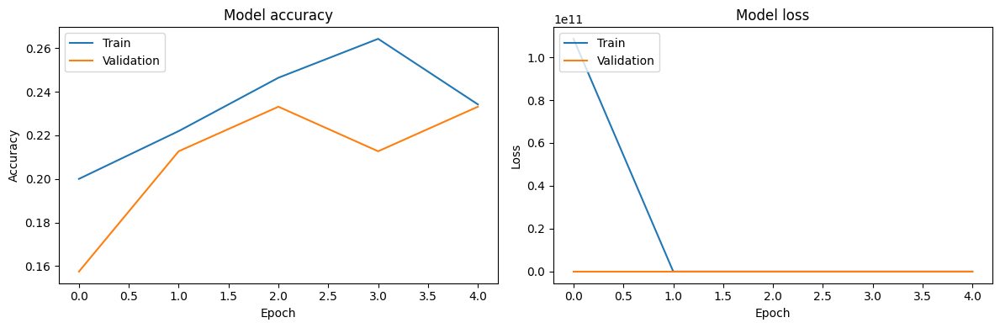

Validation Accuracy: 0.23312883079051971
Learning Rate: 0.1
Dropout Rate: 0.2
Epoch 1/50
62/62 [==============================] - 5s 39ms/step - loss: 169579151360.0000 - accuracy: 0.2245 - val_loss: 1.7623 - val_accuracy: 0.2127
Epoch 2/50
62/62 [==============================] - 2s 36ms/step - loss: 4.2489 - accuracy: 0.2352 - val_loss: 1.6080 - val_accuracy: 0.2331
Epoch 3/50
62/62 [==============================] - 2s 36ms/step - loss: 1.9843 - accuracy: 0.2429 - val_loss: 1.6125 - val_accuracy: 0.2331
Epoch 4/50
62/62 [==============================] - 2s 36ms/step - loss: 2.2758 - accuracy: 0.2449 - val_loss: 1.6181 - val_accuracy: 0.2331
Epoch 5/50
62/62 [==============================] - 2s 36ms/step - loss: 1.6410 - accuracy: 0.2388 - val_loss: 1.6031 - val_accuracy: 0.2331
Epoch 6/50
62/62 [==============================] - 2s 36ms/step - loss: 1.6978 - accuracy: 0.2536 - val_loss: 1.6178 - val_accuracy: 0.2127
Epoch 7/50
62/62 [==============================] - 2s 36ms/step 

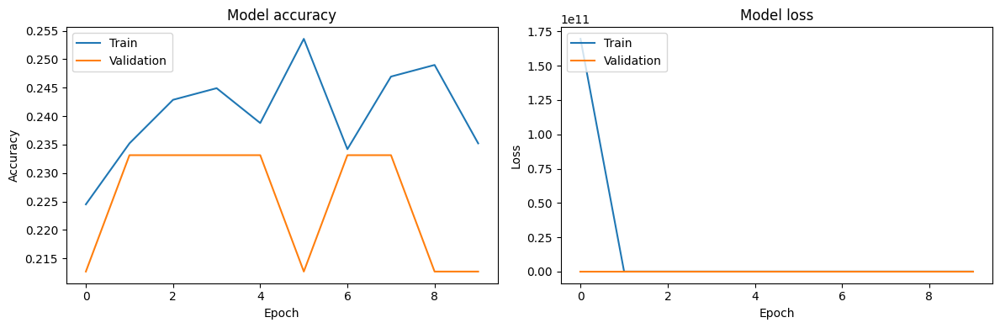

Validation Accuracy: 0.2126789391040802
Learning Rate: 0.1
Dropout Rate: 0.3
Epoch 1/50
62/62 [==============================] - 5s 39ms/step - loss: 593268244480.0000 - accuracy: 0.2071 - val_loss: 1.6346 - val_accuracy: 0.2331
Epoch 2/50
62/62 [==============================] - 2s 36ms/step - loss: 7.0459 - accuracy: 0.2398 - val_loss: 1.6123 - val_accuracy: 0.2331
Epoch 3/50
62/62 [==============================] - 2s 36ms/step - loss: 5.7716 - accuracy: 0.2393 - val_loss: 1.6081 - val_accuracy: 0.2331
Epoch 4/50
62/62 [==============================] - 2s 36ms/step - loss: 4.6630 - accuracy: 0.2321 - val_loss: 1.6020 - val_accuracy: 0.2331
Epoch 5/50
62/62 [==============================] - 2s 36ms/step - loss: 2.9513 - accuracy: 0.2393 - val_loss: 1.6025 - val_accuracy: 0.2331
Epoch 6/50
62/62 [==============================] - 2s 36ms/step - loss: 2.0775 - accuracy: 0.2485 - val_loss: 1.6116 - val_accuracy: 0.2331
Epoch 7/50
62/62 [==============================] - 2s 36ms/step -

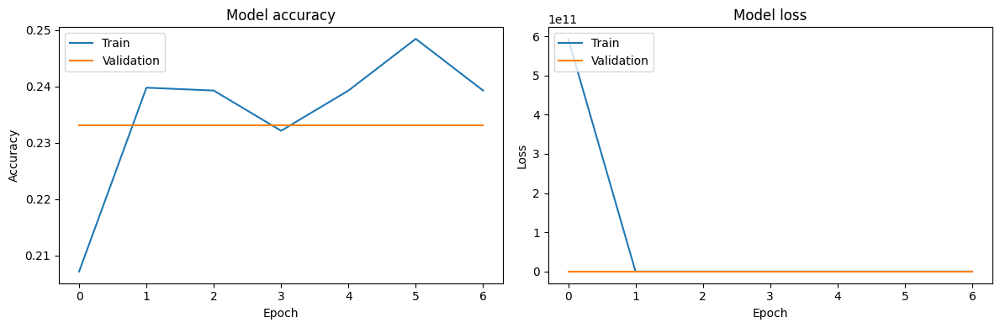

Validation Accuracy: 0.23312883079051971
Learning Rate: 0.1
Dropout Rate: 0.5
Epoch 1/50
62/62 [==============================] - 5s 39ms/step - loss: 15867735040.0000 - accuracy: 0.2061 - val_loss: 1.6178 - val_accuracy: 0.2331
Epoch 2/50
62/62 [==============================] - 2s 36ms/step - loss: 5036.6484 - accuracy: 0.2495 - val_loss: 1.6252 - val_accuracy: 0.2331
Epoch 3/50
62/62 [==============================] - 2s 36ms/step - loss: 173.1394 - accuracy: 0.2592 - val_loss: 1.6094 - val_accuracy: 0.2331
Epoch 4/50
62/62 [==============================] - 2s 35ms/step - loss: 41.4564 - accuracy: 0.2490 - val_loss: 1.6192 - val_accuracy: 0.2331
Epoch 5/50
62/62 [==============================] - 2s 35ms/step - loss: 87.2723 - accuracy: 0.2311 - val_loss: 1.6063 - val_accuracy: 0.2331
Epoch 6/50
62/62 [==============================] - 2s 35ms/step - loss: 30.7118 - accuracy: 0.2510 - val_loss: 1.6035 - val_accuracy: 0.2127
Epoch 7/50
62/62 [==============================] - 2s 35m

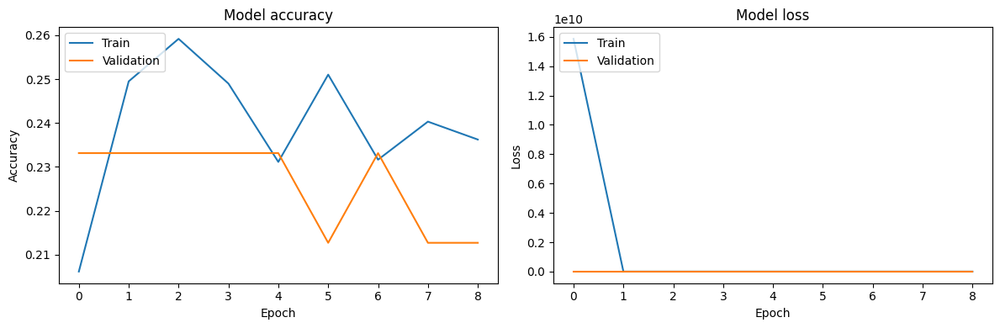

Validation Accuracy: 0.2126789391040802
Learning Rate: 0.1
Dropout Rate: 0.7
Best Learning Rate: 0.001
Best Dropout Rate: 0.2
Best Validation Accuracy: 0.952965259552002


<Figure size 1000x800 with 0 Axes>

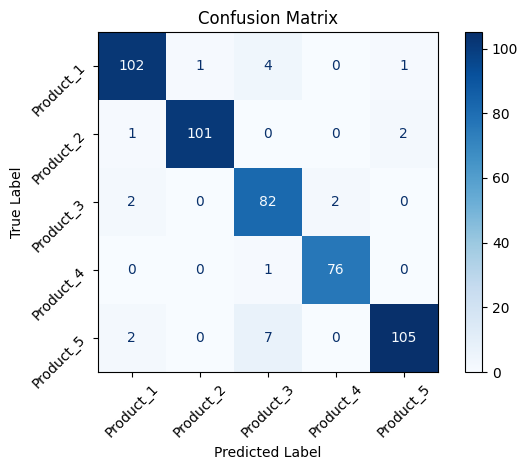

In [ ]:
# Define directories and parameters
num_classes = len(class_names)
learning_rates = [0.001, 0.01, 0.1]
dropout_rates = [0.2,0.3, 0.5, 0.7]
epochs = 50  # Define the number of epochs

# Define lists to store training and validation metrics
best_accuracy = 0
best_lr = None
best_dr = None
best_model = None
best_confusion_matrix = None

for lr in learning_rates:
    for dr in dropout_rates:
        model = Sequential([
            layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
            layers.Conv2D(32, 3, padding='same', activation='relu'),
            layers.MaxPooling2D(),

            layers.Conv2D(64, 3, padding='same', activation='relu'),
            layers.MaxPooling2D(),

            layers.Conv2D(128, 3, padding='same', activation='relu'),
            layers.MaxPooling2D(),

            layers.Conv2D(256, 3, padding='same', activation='relu'),
            layers.MaxPooling2D(),

            layers.Conv2D(512, 3, padding='same', activation='relu'),
            layers.MaxPooling2D(),

            layers.Conv2D(1024, 3, padding='same', activation='relu'),
            layers.MaxPooling2D(),

            layers.Conv2D(1024, 3, padding='same', activation='relu'),
            layers.MaxPooling2D(),

            layers.Flatten(),
            layers.Dense(1024, activation='relu'),
            layers.Dropout(dr),
            layers.Dense(512, activation='relu'),
            layers.Dropout(dr),
            layers.Dense(num_classes, activation='softmax')
        ])

        optimizer = Adam(learning_rate=lr)

        model.compile(optimizer=optimizer,
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        # Train the model
        history = model.fit(
            train_ds,
            validation_data=val_ds,
            epochs=epochs,
            callbacks=[EarlyStopping(patience=3)],
        )

        # Calculate validation accuracy
        val_accuracy = history.history['val_accuracy'][-1]

        # Update best accuracy and model if necessary
        if val_accuracy > best_accuracy:
            best_accuracy = val_accuracy
            best_lr = lr
            best_dr = dr
            best_model = model

            # Generate confusion matrix
            y_true = np.concatenate([y for x, y in val_ds], axis=0)
            y_pred = np.argmax(model.predict(val_ds), axis=-1)
            best_confusion_matrix = confusion_matrix(y_true, y_pred)
        # Plotting the loss and accuracy curves
        plt.figure(figsize=(12, 4))

        # Plot training & validation accuracy values
        plt.subplot(1, 2, 1)
        plt.plot(history.history['accuracy'])
        plt.plot(history.history['val_accuracy'])
        plt.title('Model accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')

        # Plot training & validation loss values
        plt.subplot(1, 2, 2)
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title('Model loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')

        plt.tight_layout()
        plt.show()
        # Print validation accuracy
        print("Validation Accuracy:", val_accuracy)
        print("Learning Rate:", lr)
        print("Dropout Rate:", dr)

# Print best hyperparameters and accuracy
print("Best Learning Rate:", best_lr)
print("Best Dropout Rate:", best_dr)
print("Best Validation Accuracy:", best_accuracy)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
ConfusionMatrixDisplay(best_confusion_matrix, display_labels=class_names).plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()


# Visualization Section

- **Model 5 data-** with background removal (rembg). Now, we are going to check the training dataset and print 16 images from it.

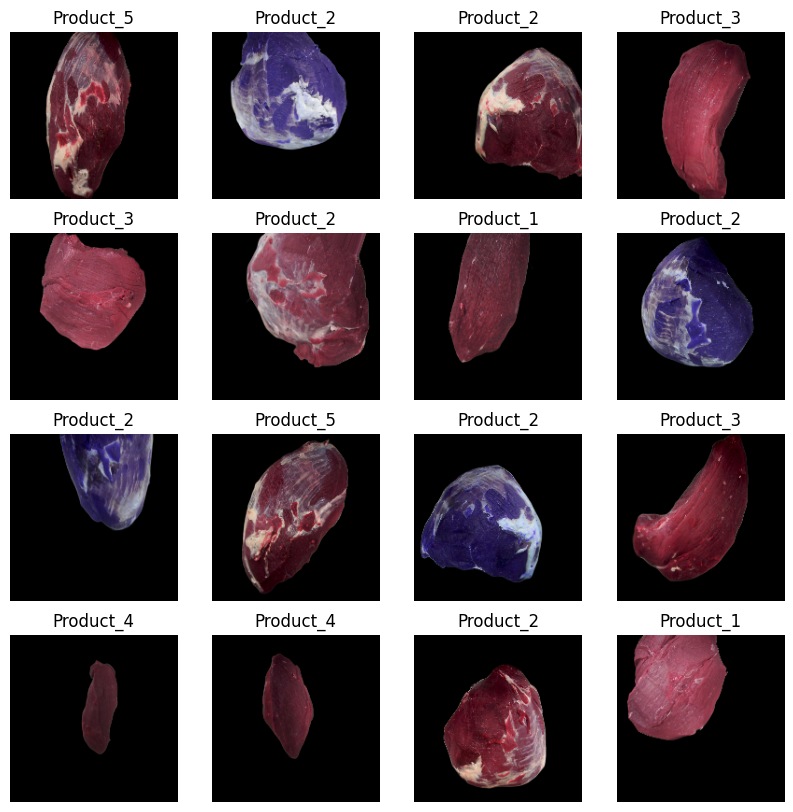

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

Also, we are going to check the validation dataset and print 16 images from it.

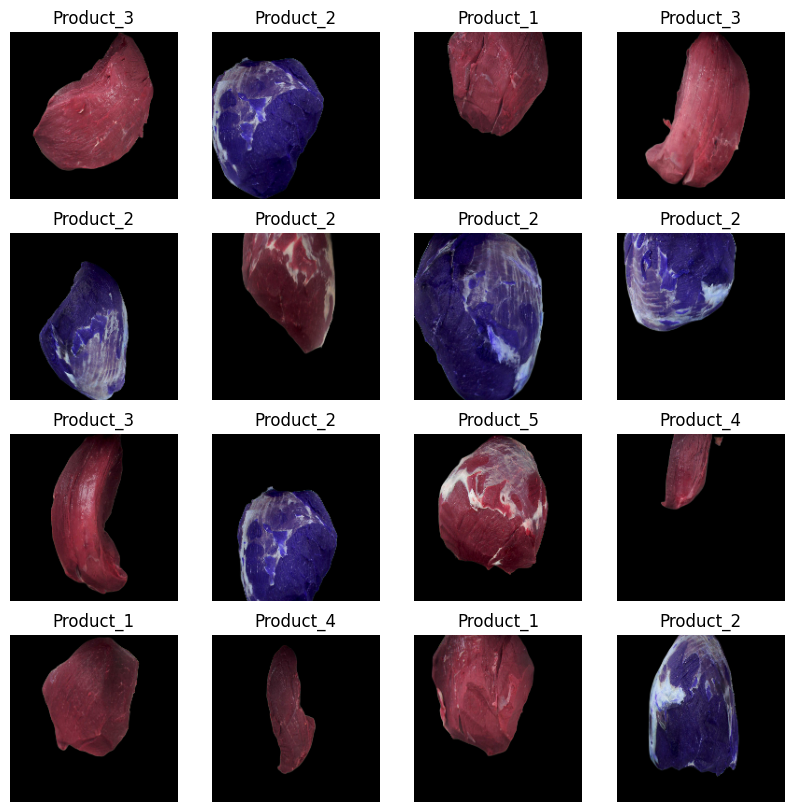

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in val_ds.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

- **Model 7 data-** with background removal (utilizing thresholding and masking). Now, we are going to check the training dataset and print 16 images from it.

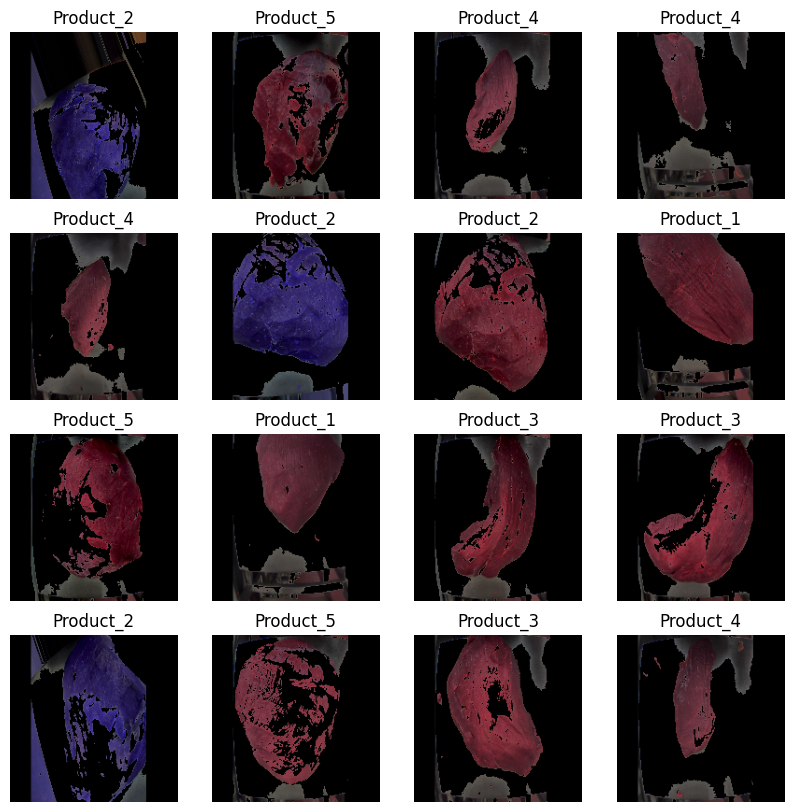

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

Also, we are going to check the validation dataset and print 16 images from it.

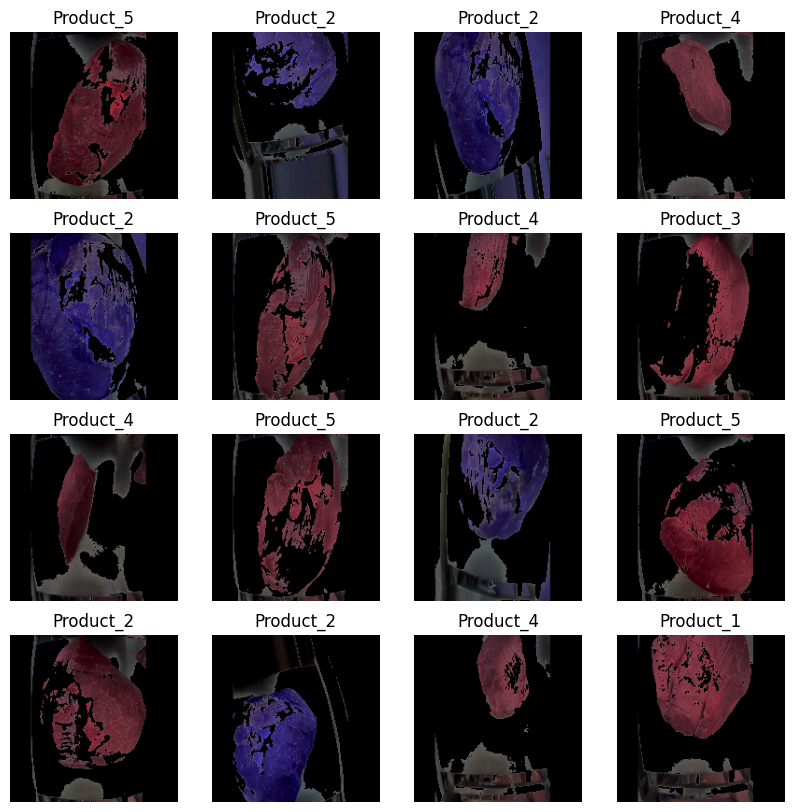

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in val_ds.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

Manually iterate over the dataset and retrieve batches of images:

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


In [ ]:
for image_batch, labels_batch in val_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


#Transfer Learning VGG16

First , we use the VGG16 model to perform the Transfer learning and then create a new model on top of it.

Steps:


1. Loading the Pre-trained Model VGG16 model pre-trained: it brings in a neural network already trained on a large dataset (ImageNet) for our task.

  - VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3)).

2. Freezing the Pre-trained Layers: Freeze the weights of the pre-trained layers and during training the layers won't be updated.

  - Setting layer.trainable = False .

3. Creating a New Model on Top: After freezing the pre-trained layers we added a new layers on top of the VGG16 base that were trained and will learn to extract features specific to our task.

  - x = layers.Flatten()(base_model.output)
  - x = layers.Dense(1024, activation='relu')(x)
  - x = layers.Dropout(0.5)(x)
  - x = layers.Dense(512, activation='relu')(x)
  - x = layers.Dropout(0.5)(x)

4. Compiling and Training the Model: The model was compiled  using Adam as optimization and after that we trained the model using model.fit() on the dataset (train_ds), validating it on a validation dataset (val_ds).

5. In our case the transfer learning happened when we got the  knowledge learned by the pre-trained VGG16 model and used it to our classification problem.

58889256/58889256 [==============================] - 0s 0us/step
Epoch 1/30
62/62 [==============================] - 12s 155ms/step - loss: 9.3309 - accuracy: 0.7709 - val_loss: 0.8597 - val_accuracy: 0.9530
Epoch 2/30
62/62 [==============================] - 5s 80ms/step - loss: 1.8936 - accuracy: 0.9265 - val_loss: 0.8601 - val_accuracy: 0.9509
Epoch 3/30
62/62 [==============================] - 5s 80ms/step - loss: 1.2415 - accuracy: 0.9439 - val_loss: 0.5632 - val_accuracy: 0.9611
Epoch 4/30
62/62 [==============================] - 5s 81ms/step - loss: 1.0246 - accuracy: 0.9469 - val_loss: 0.5911 - val_accuracy: 0.9652
Epoch 5/30
62/62 [==============================] - 5s 81ms/step - loss: 0.7261 - accuracy: 0.9546 - val_loss: 0.6848 - val_accuracy: 0.9652
Epoch 6/30
62/62 [==============================] - 5s 81ms/step - loss: 0.7722 - accuracy: 0.9633 - val_loss: 1.1695 - val_accuracy: 0.9530
Epoch 7/30
62/62 [==============================] - 5s 81ms/step - loss: 1.0931 - accur

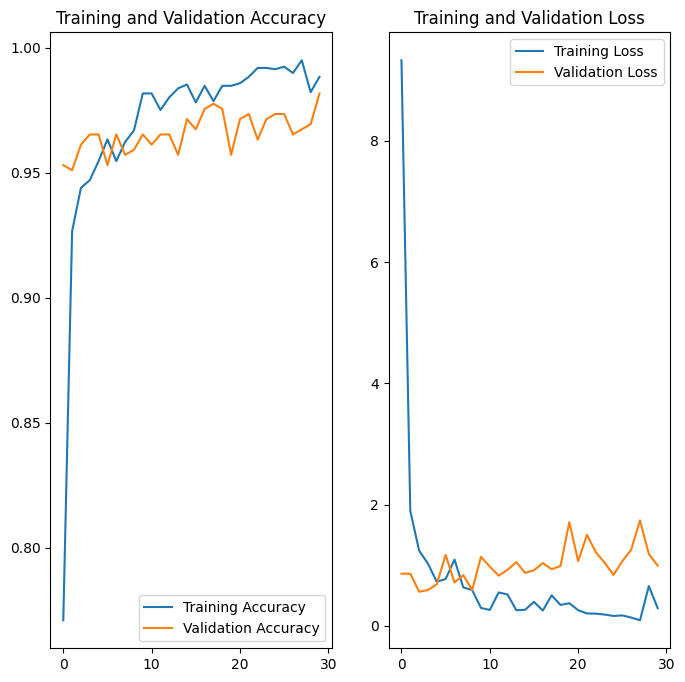

In [ ]:
# Load the VGG16 model pre-trained on ImageNet data
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top of the VGG16 base
x = layers.Flatten()(base_model.output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
output = layers.Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(optimizer=Adam(),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=epochs)

# Plot training and validation curves
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.show()


Model report:
Validation accuracy: 98.22%
Validation loss: 1.48
Training accuracy steadily increases and validation accuracy remains consistently high throughout training, indicating good generalization performance.
Validation loss remains relatively stable, indicating good convergence.

# **References:**

[1] Scikit learn: https://scikit-learn.org/stable/

[2] Stackoverflow: https://stackoverflow.com/

[3] Kaggle: https://www.kaggle.com/

[4] Prakash, S., Berry, D. P., Roantree, M., Onibonoje, O., Gualano, L., Scriney, M., & McCarren, A. (2021). Using artificial intelligence to automate meat cut identification from the semimembranosus muscle on beef boning lines. Journal of Animal Science, 99(12), 1–13. https://doi.org/10.1093/jas/skab319

[5] Géron, A. 2019. Hands-on machine learning with Scikit-Learn, Keras,
and TensorFlow: concepts, tools, and techniques to build intelligent
systems. Sebastopol, CA: O′Reilly Media Inc

[6] van Rossum, G. n.d. Python Release Python 3.6.0 [WWW
Document]. Available from https://www.python.org/
downloads/release/python-360/ [accessed April 20, 2024].

[7] Lecture Notes: https://study.dbs.ie/2122/msc-data/B9DA109/

https://study.dbs.ie/2122/msc-data/B9DA109/u1/index.html#/ https://study.dbs.ie/2122/msc-data/B9DA109/u2/index.html#/lessons/581oVBQjVCpps7kTvW9zYulimrk1SOdz
